In [93]:
if __name__ == '__main__':
    import sys
    import os
    from pathlib import Path
    curr_file_path = Path(os.path.abspath(''))
    sys.path.append(str(curr_file_path.parent))

import numpy as np
import glob2 as glob
import matplotlib as mpl
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import pickle
from sklearn.linear_model import LinearRegression
from aux_funcs import colored_line, compressed_read
# from aux_funcs import parse_string_with_regex, ordered_colors_from_cmap

plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.size'] = 14
plt.rcParams['axes.linewidth'] = 2.0

In [157]:
def load_hidden_activity(data_path, averaging_size=1):
    file_names = glob.glob(data_path)
    data = []
    for file_name in file_names:
        data_for_file = np.load(file_name)
        data.append(data_for_file)
    data = np.concatenate(data, axis=1)
    if averaging_size == 1:
        return data
    reduced_data = np.empty((data.shape[0], int(data.shape[1] / averaging_size)))
    for k in range(0, int(data.shape[1] / averaging_size) * averaging_size, averaging_size):
        reduced_data[:, int(k / averaging_size)] = data[:, k:k + averaging_size].mean(axis=1)
    return reduced_data

def load_state_data(data_path, indices=[], all=False):
#     file_names = glob.glob(data_path)
    file_names = sorted(os.listdir(data_path))
    print(file_names)
    for fidx, file_name in enumerate(file_names):
        if all or fidx in indices or (len(indices) == 0 and fidx + 1 == len(file_names)):
            data_for_file = compressed_read(os.path.join(data_path, file_name))
            yield data_for_file

In [163]:
def parse_session(data_path, env_idx):
    state_data = load_state_data(
        data_path,
        all=True,
    )
    
    d = state_data.__next__()

    features = [
        'current_patch_num',
        'reward_site_idx',
        'current_reward_site_attempted',
        'agent_in_patch',
        'patch_reward_param',
        'action',
        'reward',
    ]

    features_to_time_series_dict = {}
    for f in features:
        features_to_time_series_dict[f] = np.zeros((len(d)))
    
    for k in np.arange(len(d)):
        for f in features:
            features_to_time_series_dict[f][k] = d[k][f][env_idx]

    features_to_time_series_dict['current_patch_num'] = features_to_time_series_dict['current_patch_num'].astype(int)

    dwell_time = np.zeros((len(d)))
    rewards_seen_in_patch = np.zeros((len(d)))
    num_patch_types = len(np.unique(features_to_time_series_dict['current_patch_num']))
    rewards_seen_in_patch_type = np.zeros((len(d), num_patch_types))
    total_stops_in_patch_type = np.zeros((len(d), num_patch_types))
    
    for idx in np.arange(0, len(d)):
        if idx > 0 and features_to_time_series_dict['action'][idx] == 0:
            dwell_time[idx] = dwell_time[idx-1] + 1
        else:
            dwell_time[idx] = 0

        if features_to_time_series_dict['agent_in_patch'][idx]:
            if idx > 0:
                rewards_seen_in_patch[idx] = rewards_seen_in_patch[idx-1] + features_to_time_series_dict['reward'][idx]
            else:
                rewards_seen_in_patch[idx] = features_to_time_series_dict['reward'][idx]

        if idx > 0:
            curr_patch_type = features_to_time_series_dict['current_patch_num'][idx]
            rewards_seen_in_patch_type[idx, :] = rewards_seen_in_patch_type[idx-1, :]
            rewards_seen_in_patch_type[idx, curr_patch_type] += features_to_time_series_dict['reward'][idx]
            total_stops_in_patch_type[idx, :] = total_stops_in_patch_type[idx-1, :]
            if features_to_time_series_dict['current_reward_site_attempted'][idx] and not features_to_time_series_dict['current_reward_site_attempted'][idx-1]:
                total_stops_in_patch_type[idx, curr_patch_type] += 1

    features_to_time_series_dict['dwell_time'] = dwell_time
    features_to_time_series_dict['rewards_seen_in_patch'] = rewards_seen_in_patch
    features_to_time_series_dict['rewards_seen_in_patch_type'] = rewards_seen_in_patch_type
    features_to_time_series_dict['total_stops_in_patch_type'] = total_stops_in_patch_type
    
    
    return features_to_time_series_dict

In [164]:
env_idx = 0

data = load_hidden_activity('../data/rl_agent_outputs/long_sesh_slow_learn_test_2024-11-14_13_52_24_131302_var_noise_0_activity_weight_0/hidden_state/*.npy')
data = np.transpose(data, [2, 1, 0])
flattened_data = data.reshape(data.shape[0], data.shape[1] * data.shape[2])
print(data.shape)
print(flattened_data.shape)

session_data = parse_session('../data/rl_agent_outputs/long_sesh_slow_learn_test_2024-11-14_13_52_24_131302_var_noise_0_activity_weight_0/state', env_idx)

pca = PCA()
pc_activities = pca.fit_transform(flattened_data.T)



(128, 210, 20000)
(128, 4200000)
['00001.pkl', '00002.pkl', '00003.pkl', '00004.pkl', '00005.pkl', '00006.pkl', '00007.pkl']


In [176]:
print(session_data['total_stops_in_patch_type'])

[[   0.    0.    0.]
 [   0.    0.    0.]
 [   0.    0.    0.]
 ...
 [1457.  700.    3.]
 [1457.  701.    3.]
 [1457.  701.    3.]]


In [165]:
print(pc_activities.shape)
explained_variance_ratios = pca.explained_variance_ratio_

(4200000, 128)


0
(4200000, 128)


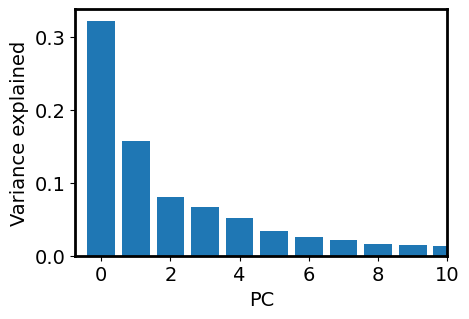

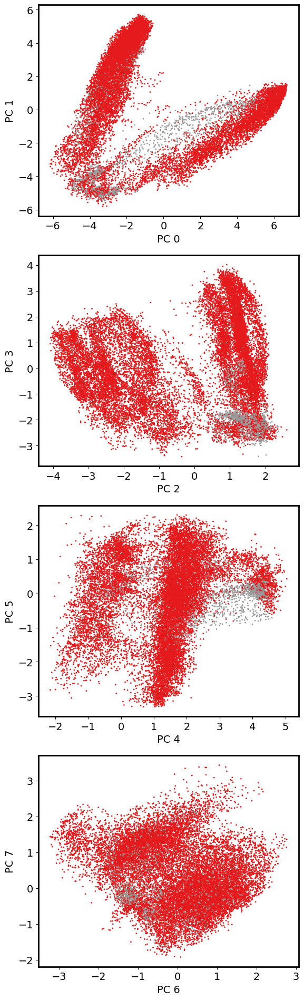

In [98]:
print(env_idx)

scale = 0.8
fig, axs = plt.subplots(1, 1, figsize=(6 * scale, 4 * scale))

axs.bar(np.arange(explained_variance_ratios.shape[0]), explained_variance_ratios)
axs.set_xlim(-0.75, 10)
axs.set_ylabel('Variance explained')
axs.set_xlabel('PC')

scale = 1.2
fig, axs = plt.subplots(4, 1, figsize=(5 * scale, 16 * scale))

print(pc_activities.shape)

for k in np.arange(0, 8, 2):
    cbar = axs[int(k/2)].scatter(
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k],
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k+1],
        s=1,
        c=session_data['agent_in_patch'],
        cmap='Set1_r',
        # vmax=2,
    )
    axs[int(k/2)].set_xlabel(f'PC {k}')
    axs[int(k/2)].set_ylabel(f'PC {k+1}')
    # fig.colorbar(cbar)
fig.tight_layout()

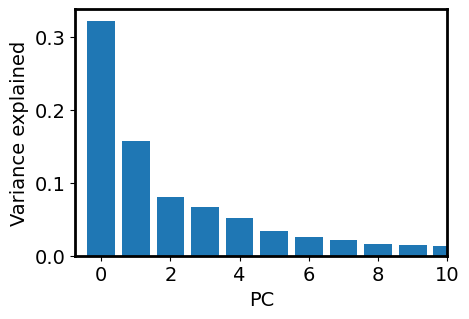

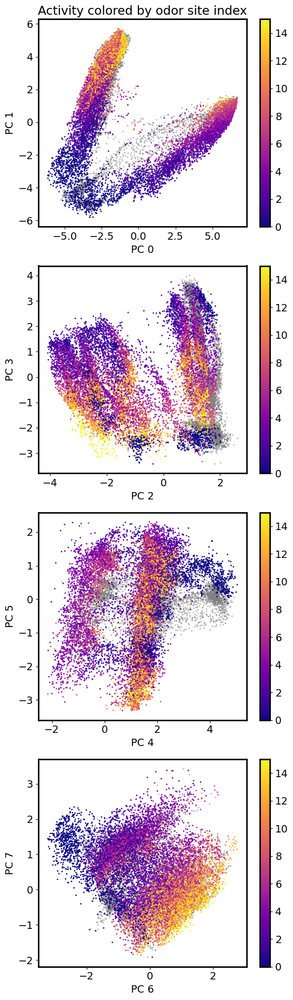

In [99]:
scale = 0.8
fig, axs = plt.subplots(1, 1, figsize=(6 * scale, 4 * scale))

axs.bar(np.arange(explained_variance_ratios.shape[0]), explained_variance_ratios)
axs.set_xlim(-0.75, 10)
axs.set_ylabel('Variance explained')
axs.set_xlabel('PC')

scale = 1.2
fig, axs = plt.subplots(4, 1, figsize=(5 * scale, 16 * scale))


for k in np.arange(0, 8, 2):
    cbar = axs[int(k/2)].scatter(
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k][session_data['reward_site_idx'] < 0],
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k+1][session_data['reward_site_idx'] < 0],
        s=1,
        c='grey',
        alpha=0.5,
        # vmax=2,
    )
    cbar = axs[int(k/2)].scatter(
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k][session_data['reward_site_idx'] >= 0],
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k+1][session_data['reward_site_idx'] >= 0],
        s=1,
        c=session_data['reward_site_idx'][session_data['reward_site_idx'] >= 0],
        cmap='plasma',
        # vmax=2,
    )
    axs[int(k/2)].set_xlabel(f'PC {k}')
    axs[int(k/2)].set_ylabel(f'PC {k+1}')
    fig.colorbar(cbar)

axs[0].set_title('Activity colored by odor site index')
fig.tight_layout()

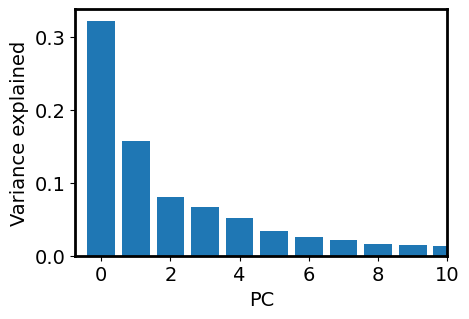

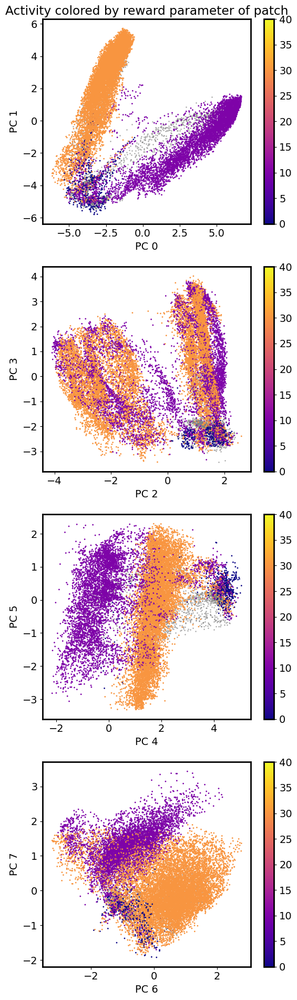

In [100]:
scale = 0.8
fig, axs = plt.subplots(1, 1, figsize=(6 * scale, 4 * scale))

axs.bar(np.arange(explained_variance_ratios.shape[0]), explained_variance_ratios)
axs.set_xlim(-0.75, 10)
axs.set_ylabel('Variance explained')
axs.set_xlabel('PC')

scale = 1.2
fig, axs = plt.subplots(4, 1, figsize=(5 * scale, 16 * scale))


for k in np.arange(0, 8, 2):
    cbar = axs[int(k/2)].scatter(
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k][session_data['agent_in_patch'] <= 0],
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k+1][session_data['agent_in_patch'] <= 0],
        s=1,
        c='grey',
        alpha=0.5,
        # vmax=2,
    )
    cbar = axs[int(k/2)].scatter(
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k][session_data['agent_in_patch'] > 0],
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k+1][session_data['agent_in_patch'] > 0],
        s=1,
        c=session_data['patch_reward_param'][session_data['agent_in_patch'] > 0],
        cmap='plasma',
        vmin=0,
        vmax=40
    )
    axs[int(k/2)].set_xlabel(f'PC {k}')
    axs[int(k/2)].set_ylabel(f'PC {k+1}')
    fig.colorbar(cbar)
axs[0].set_title('Activity colored by reward parameter of patch')
fig.tight_layout()


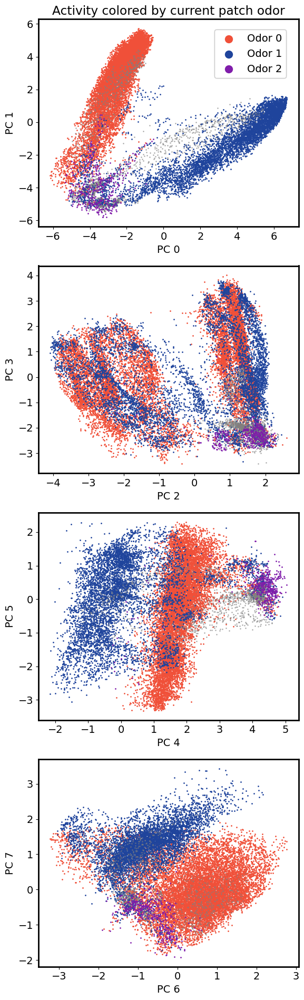

In [145]:
scale = 1.2
fig, axs = plt.subplots(4, 1, figsize=(5 * scale, 16 * scale))
colors = ['#F05039', '#1F449C', '#801dab']

for k in np.arange(0, 8, 2):
    for i in range(3):
        patch_nums = session_data['current_patch_num'].astype(int)
        mask_on = np.logical_and(session_data['agent_in_patch'] > 0, patch_nums == i)
        mask_off = np.logical_and(session_data['agent_in_patch'] <= 0, patch_nums == i)
        
        axs[int(k/2)].scatter(
            pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k][mask_off],
            pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k+1][mask_off],
            s=1,
            c='grey',
            alpha=0.5,
        )
        if k == 0:
            axs[int(k/2)].scatter(
                pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k][mask_on],
                pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k+1][mask_on],
                s=1,
                color=colors[i],
                label=f'Odor {i}'
            )
        else:
            axs[int(k/2)].scatter(
                pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k][mask_on],
                pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k+1][mask_on],
                s=1,
                color=colors[i],
            )
    axs[int(k/2)].set_xlabel(f'PC {k}')
    axs[int(k/2)].set_ylabel(f'PC {k+1}')
    axs[0].set_title('Activity colored by current patch odor')
    fig.legend(markerscale=10, bbox_to_anchor=(0.94, 0.97))
fig.tight_layout()


Text(0.5, 1.0, 'Activity colored by reward')

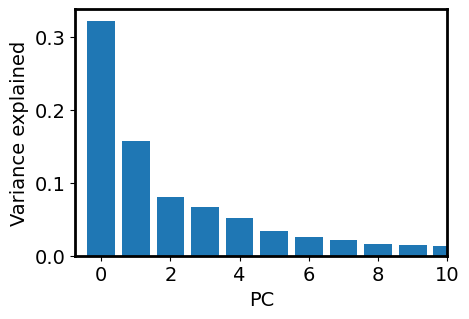

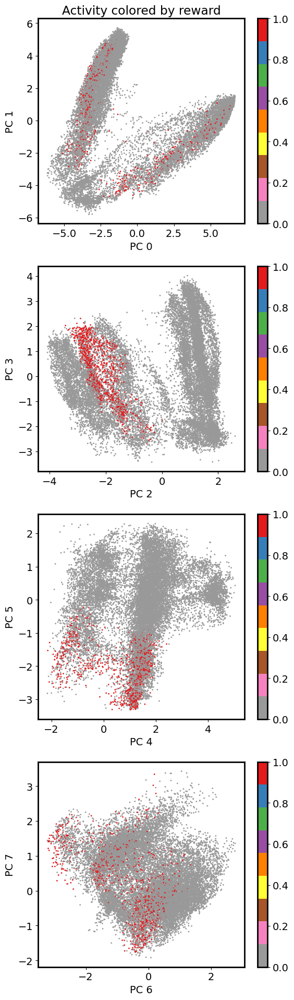

In [119]:
scale = 0.8
fig, axs = plt.subplots(1, 1, figsize=(6 * scale, 4 * scale))

axs.bar(np.arange(explained_variance_ratios.shape[0]), explained_variance_ratios)
axs.set_xlim(-0.75, 10)
axs.set_ylabel('Variance explained')
axs.set_xlabel('PC')

scale = 1.2
fig, axs = plt.subplots(4, 1, figsize=(5 * scale, 16 * scale))


for k in np.arange(0, 8, 2):
    cbar = axs[int(k/2)].scatter(
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k],
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k+1],
        s=1,
        c=session_data['reward'],
        cmap='Set1_r',
        # vmax=2,
    )
    axs[int(k/2)].set_xlabel(f'PC {k}')
    axs[int(k/2)].set_ylabel(f'PC {k+1}')
    fig.colorbar(cbar)
fig.tight_layout()

axs[0].set_title('Activity colored by reward')


In [103]:
def masks_to_colors(masks):
    c = np.zeros(masks[0].shape)
    for mask_idx, mask in enumerate(masks):
        c[mask] = mask_idx + 1
    return c

Text(0.5, 1.0, 'Steps since reward observed')

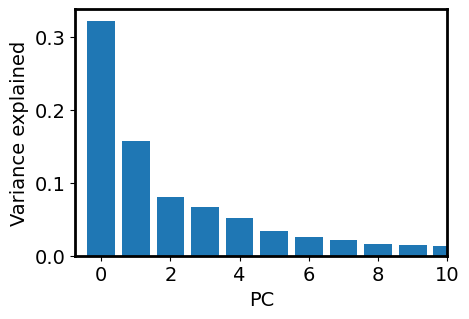

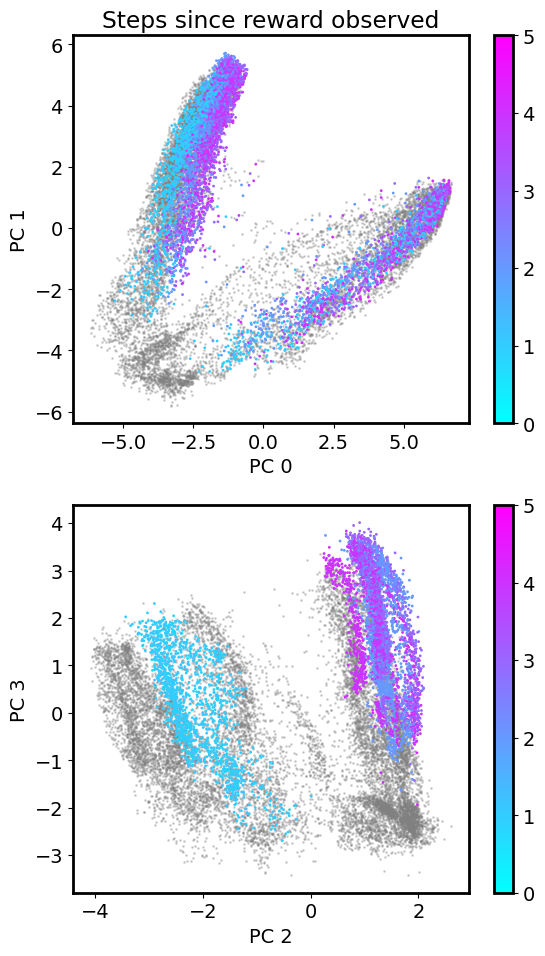

In [104]:
scale = 0.8
fig, axs = plt.subplots(1, 1, figsize=(6 * scale, 4 * scale))

axs.bar(np.arange(explained_variance_ratios.shape[0]), explained_variance_ratios)
axs.set_xlim(-0.75, 10)
axs.set_ylabel('Variance explained')
axs.set_xlabel('PC')

num_pcs = 4

scale = 1.2
fig, axs = plt.subplots(int(num_pcs / 2), 1, figsize=(5 * scale, 2 * num_pcs * scale))

masks = [np.logical_and(np.roll(session_data['reward'], i).astype(bool), np.roll(session_data['dwell_time'], i) == 4) for i in range(0, 4)]
c = masks_to_colors(masks)

for k in np.arange(0, num_pcs, 2):
    axs[int(k/2)].scatter(
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k][c == 0],
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k+1][c == 0],
        s=1,
        color='grey',
        alpha=0.3,
        # vmax=2,
    )
    
    cbar = axs[int(k/2)].scatter(
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k][c > 0],
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k+1][c > 0],
        s=1,
        c=c[c > 0],
        cmap='cool',
        vmin=0,
        vmax=c.max() + 1,
    )
    axs[int(k/2)].set_xlabel(f'PC {k}')
    axs[int(k/2)].set_ylabel(f'PC {k+1}')
    fig.colorbar(cbar)
fig.tight_layout()

axs[0].set_title('Steps since reward observed')


Text(0.5, 1.0, 'Steps since reward missed')

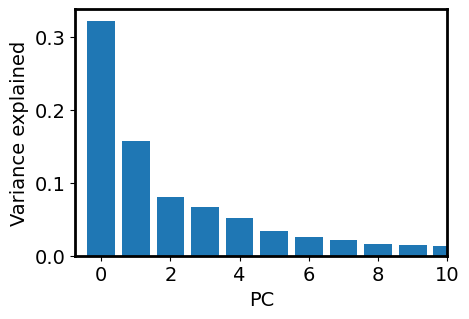

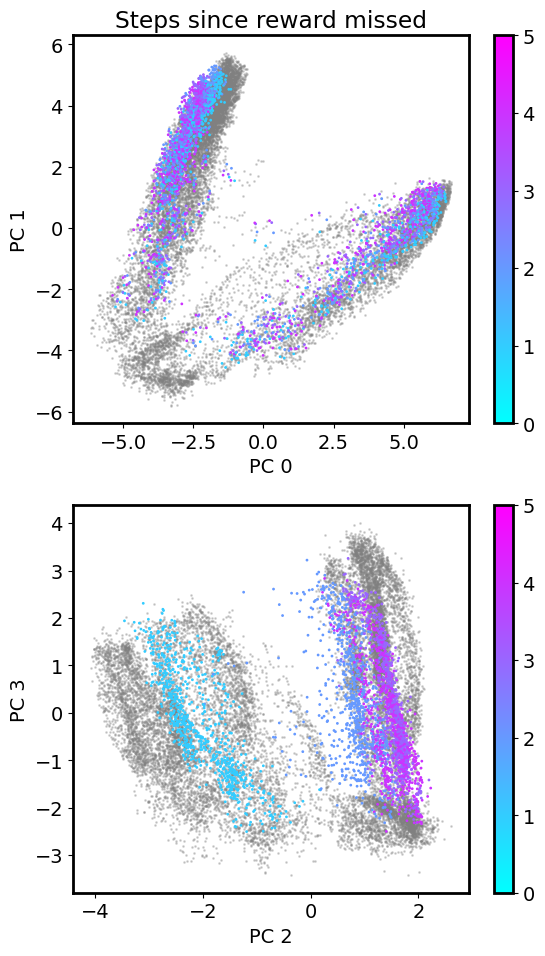

In [105]:
scale = 0.8
fig, axs = plt.subplots(1, 1, figsize=(6 * scale, 4 * scale))

axs.bar(np.arange(explained_variance_ratios.shape[0]), explained_variance_ratios)
axs.set_xlim(-0.75, 10)
axs.set_ylabel('Variance explained')
axs.set_xlabel('PC')

num_pcs = 4

scale = 1.2
fig, axs = plt.subplots(int(num_pcs / 2), 1, figsize=(5 * scale, 2 * num_pcs * scale))

masks = [np.logical_and(~(np.roll(session_data['reward'], i).astype(bool)), np.roll(session_data['dwell_time'], i) == 4) for i in range(0, 4)]
c = masks_to_colors(masks)

for k in np.arange(0, num_pcs, 2):
    axs[int(k/2)].scatter(
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k][c == 0],
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k+1][c == 0],
        s=1,
        color='grey',
        alpha=0.3,
        # vmax=2,
    )
    
    cbar = axs[int(k/2)].scatter(
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k][c > 0],
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k+1][c > 0],
        s=1,
        c=c[c > 0],
        cmap='cool',
        vmin=0,
        vmax=c.max() + 1,
    )
    axs[int(k/2)].set_xlabel(f'PC {k}')
    axs[int(k/2)].set_ylabel(f'PC {k+1}')
    fig.colorbar(cbar)

    
fig.tight_layout()

axs[0].set_title('Steps since reward missed')

Text(0.5, 1.0, 'Activity colored by dwell time')

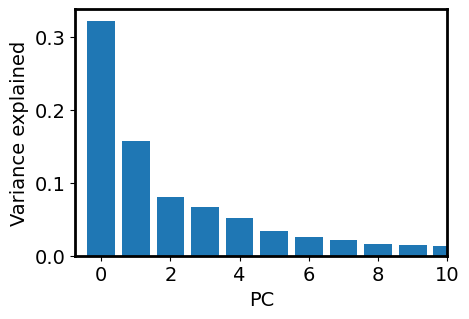

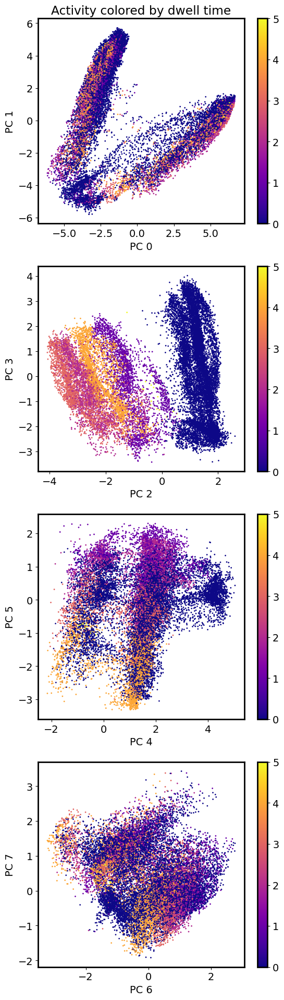

In [106]:
scale = 0.8
fig, axs = plt.subplots(1, 1, figsize=(6 * scale, 4 * scale))

axs.bar(np.arange(explained_variance_ratios.shape[0]), explained_variance_ratios)
axs.set_xlim(-0.75, 10)
axs.set_ylabel('Variance explained')
axs.set_xlabel('PC')

scale = 1.2
fig, axs = plt.subplots(4, 1, figsize=(5 * scale, 16 * scale))


for k in np.arange(0, 8, 2):
    cbar = axs[int(k/2)].scatter(
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k],
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k+1],
        s=1,
        c=session_data['dwell_time'],
        cmap='plasma',
        # vmax=2,
    )
    axs[int(k/2)].set_xlabel(f'PC {k}')
    axs[int(k/2)].set_ylabel(f'PC {k+1}')
    fig.colorbar(cbar)
fig.tight_layout()

axs[0].set_title('Activity colored by dwell time')

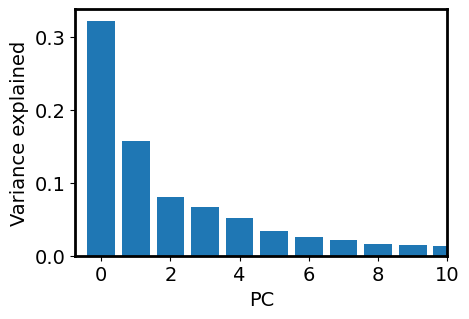

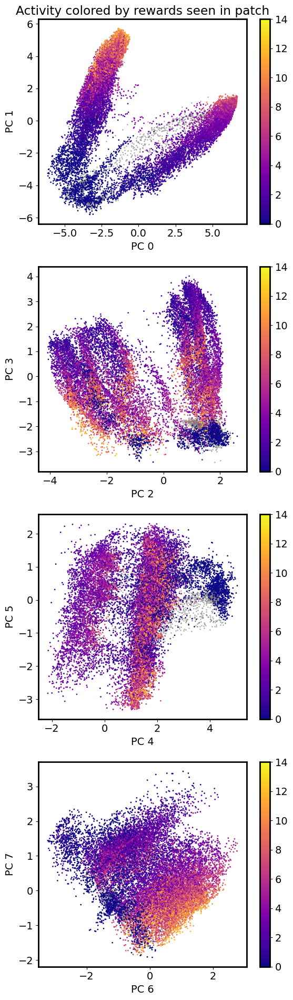

In [107]:
scale = 0.8
fig, axs = plt.subplots(1, 1, figsize=(6 * scale, 4 * scale))

axs.bar(np.arange(explained_variance_ratios.shape[0]), explained_variance_ratios)
axs.set_xlim(-0.75, 10)
axs.set_ylabel('Variance explained')
axs.set_xlabel('PC')

scale = 1.2
fig, axs = plt.subplots(4, 1, figsize=(5 * scale, 16 * scale))


for k in np.arange(0, 8, 2):
    cbar = axs[int(k/2)].scatter(
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k][session_data['agent_in_patch'] <= 0],
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k+1][session_data['agent_in_patch'] <= 0],
        s=1,
        c='grey',
        alpha=0.5,
        # vmax=2,
    )
    cbar = axs[int(k/2)].scatter(
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k][session_data['agent_in_patch'] > 0],
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k+1][session_data['agent_in_patch'] > 0],
        s=1,
        c=session_data['rewards_seen_in_patch'][session_data['agent_in_patch'] > 0],
        cmap='plasma',
        vmin=0,
    )
    axs[int(k/2)].set_xlabel(f'PC {k}')
    axs[int(k/2)].set_ylabel(f'PC {k+1}')
    fig.colorbar(cbar)
axs[0].set_title('Activity colored by rewards seen in patch')
fig.tight_layout()

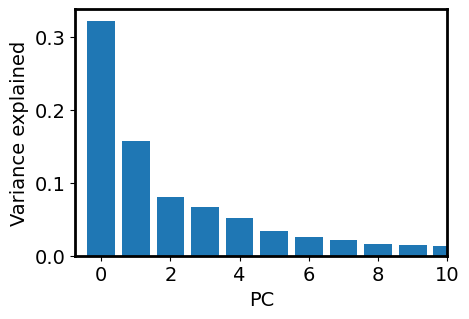

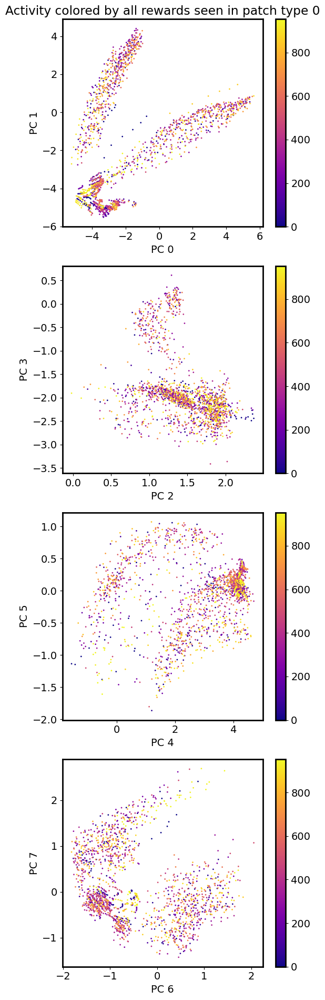

In [182]:
scale = 0.8
fig, axs = plt.subplots(1, 1, figsize=(6 * scale, 4 * scale))

axs.bar(np.arange(explained_variance_ratios.shape[0]), explained_variance_ratios)
axs.set_xlim(-0.75, 10)
axs.set_ylabel('Variance explained')
axs.set_xlabel('PC')

scale = 1.2
fig, axs = plt.subplots(4, 1, figsize=(5 * scale, 16 * scale))


for k in np.arange(0, 8, 2):
        # patch_nums = session_data['current_patch_num'].astype(int)
        # mask_on = np.logical_and(session_data['agent_in_patch'] > 0, patch_nums == i)
        # mask_off = np.logical_and(session_data['agent_in_patch'] <= 0, patch_nums == i)
    cbar = axs[int(k/2)].scatter(
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k][session_data['agent_in_patch'] <= 0],
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k+1][session_data['agent_in_patch'] <= 0],
        s=1,
        c=(session_data['rewards_seen_in_patch_type'][:, 0])[session_data['agent_in_patch'] <= 0],
        alpha=1,
        cmap='plasma',
        vmin=0,
    )
    axs[int(k/2)].set_xlabel(f'PC {k}')
    axs[int(k/2)].set_ylabel(f'PC {k+1}')
    fig.colorbar(cbar)
axs[0].set_title('Activity colored by all rewards seen in patch type 0')
fig.tight_layout()

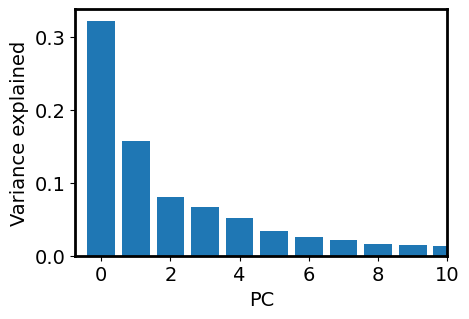

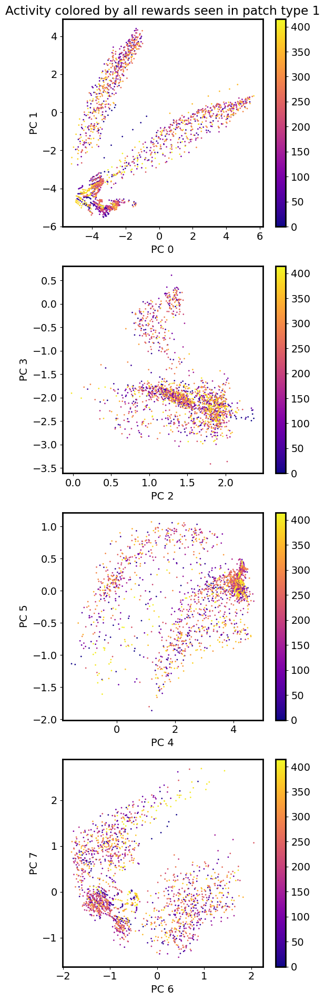

In [183]:
scale = 0.8
fig, axs = plt.subplots(1, 1, figsize=(6 * scale, 4 * scale))

axs.bar(np.arange(explained_variance_ratios.shape[0]), explained_variance_ratios)
axs.set_xlim(-0.75, 10)
axs.set_ylabel('Variance explained')
axs.set_xlabel('PC')

scale = 1.2
fig, axs = plt.subplots(4, 1, figsize=(5 * scale, 16 * scale))


for k in np.arange(0, 8, 2):
        # patch_nums = session_data['current_patch_num'].astype(int)
        # mask_on = np.logical_and(session_data['agent_in_patch'] > 0, patch_nums == i)
        # mask_off = np.logical_and(session_data['agent_in_patch'] <= 0, patch_nums == i)
    cbar = axs[int(k/2)].scatter(
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k][session_data['agent_in_patch'] <= 0],
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k+1][session_data['agent_in_patch'] <= 0],
        s=1,
        c=(session_data['rewards_seen_in_patch_type'][:, 1])[session_data['agent_in_patch'] <= 0],
        alpha=1,
        cmap='plasma',
        vmin=0,
    )
    axs[int(k/2)].set_xlabel(f'PC {k}')
    axs[int(k/2)].set_ylabel(f'PC {k+1}')
    fig.colorbar(cbar)
axs[0].set_title('Activity colored by all rewards seen in patch type 1')
fig.tight_layout()

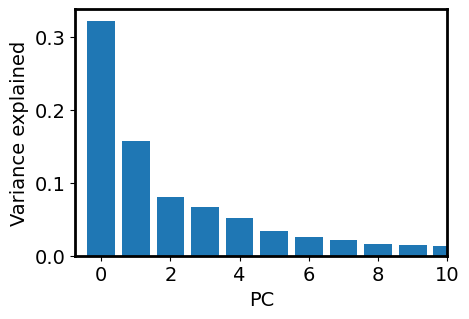

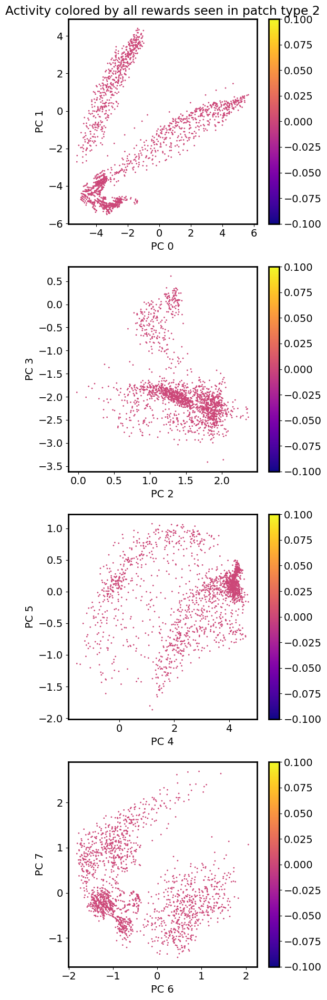

In [184]:
scale = 0.8
fig, axs = plt.subplots(1, 1, figsize=(6 * scale, 4 * scale))

axs.bar(np.arange(explained_variance_ratios.shape[0]), explained_variance_ratios)
axs.set_xlim(-0.75, 10)
axs.set_ylabel('Variance explained')
axs.set_xlabel('PC')

scale = 1.2
fig, axs = plt.subplots(4, 1, figsize=(5 * scale, 16 * scale))


for k in np.arange(0, 8, 2):
        # patch_nums = session_data['current_patch_num'].astype(int)
        # mask_on = np.logical_and(session_data['agent_in_patch'] > 0, patch_nums == i)
        # mask_off = np.logical_and(session_data['agent_in_patch'] <= 0, patch_nums == i)
    cbar = axs[int(k/2)].scatter(
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k][session_data['agent_in_patch'] <= 0],
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k+1][session_data['agent_in_patch'] <= 0],
        s=1,
        c=(session_data['rewards_seen_in_patch_type'][:, 2])[session_data['agent_in_patch'] <= 0],
        alpha=1,
        cmap='plasma',
        vmin=0,
    )
    axs[int(k/2)].set_xlabel(f'PC {k}')
    axs[int(k/2)].set_ylabel(f'PC {k+1}')
    fig.colorbar(cbar)
axs[0].set_title('Activity colored by all rewards seen in patch type 2')
fig.tight_layout()

In [199]:
env_idx = 1

data = load_hidden_activity('../data/rl_agent_outputs/long_sesh_slow_learn_test_2024-11-14_13_52_24_131302_var_noise_0_activity_weight_0/hidden_state/*.npy')
data = np.transpose(data, [2, 1, 0])
flattened_data = data.reshape(data.shape[0], data.shape[1] * data.shape[2])
print(data.shape)
print(flattened_data.shape)

session_data = parse_session('../data/rl_agent_outputs/long_sesh_slow_learn_test_2024-11-14_13_52_24_131302_var_noise_0_activity_weight_0/state', env_idx)

pca = PCA()
pc_activities = pca.fit_transform(flattened_data.T)

(128, 210, 20000)
(128, 4200000)
['00001.pkl', '00002.pkl', '00003.pkl', '00004.pkl', '00005.pkl', '00006.pkl', '00007.pkl']


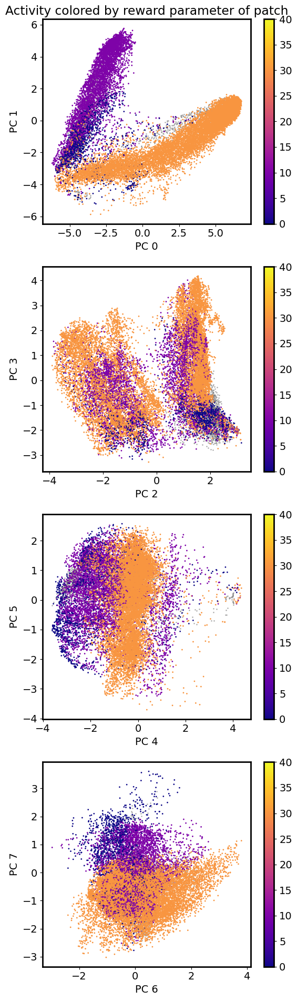

In [187]:
scale = 1.2
fig, axs = plt.subplots(4, 1, figsize=(5 * scale, 16 * scale))


for k in np.arange(0, 8, 2):
    cbar = axs[int(k/2)].scatter(
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k][session_data['agent_in_patch'] <= 0],
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k+1][session_data['agent_in_patch'] <= 0],
        s=1,
        c='grey',
        alpha=0.5,
        # vmax=2,
    )
    cbar = axs[int(k/2)].scatter(
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k][session_data['agent_in_patch'] > 0],
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k+1][session_data['agent_in_patch'] > 0],
        s=1,
        c=session_data['patch_reward_param'][session_data['agent_in_patch'] > 0],
        cmap='plasma',
        vmin=0,
        vmax=40,
    )
    axs[int(k/2)].set_xlabel(f'PC {k}')
    axs[int(k/2)].set_ylabel(f'PC {k+1}')
    fig.colorbar(cbar)
axs[0].set_title('Activity colored by reward parameter of patch')
fig.tight_layout()

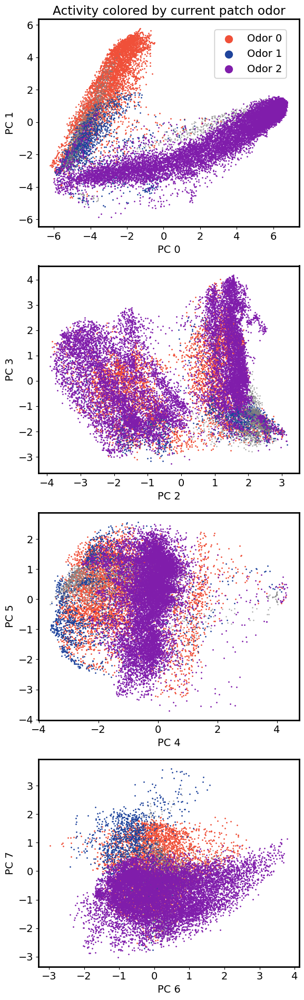

In [188]:
scale = 1.2
fig, axs = plt.subplots(4, 1, figsize=(5 * scale, 16 * scale))
colors = ['#F05039', '#1F449C', '#801dab']

for k in np.arange(0, 8, 2):
    for i in range(3):
        patch_nums = session_data['current_patch_num'].astype(int)
        mask_on = np.logical_and(session_data['agent_in_patch'] > 0, patch_nums == i)
        mask_off = np.logical_and(session_data['agent_in_patch'] <= 0, patch_nums == i)
        
        axs[int(k/2)].scatter(
            pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k][mask_off],
            pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k+1][mask_off],
            s=1,
            c='grey',
            alpha=0.5,
        )
        if k == 0:
            axs[int(k/2)].scatter(
                pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k][mask_on],
                pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k+1][mask_on],
                s=1,
                color=colors[i],
                label=f'Odor {i}'
            )
        else:
            axs[int(k/2)].scatter(
                pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k][mask_on],
                pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k+1][mask_on],
                s=1,
                color=colors[i],
            )
    axs[int(k/2)].set_xlabel(f'PC {k}')
    axs[int(k/2)].set_ylabel(f'PC {k+1}')
    axs[0].set_title('Activity colored by current patch odor')
    fig.legend(markerscale=10, bbox_to_anchor=(0.94, 0.97))
fig.tight_layout()


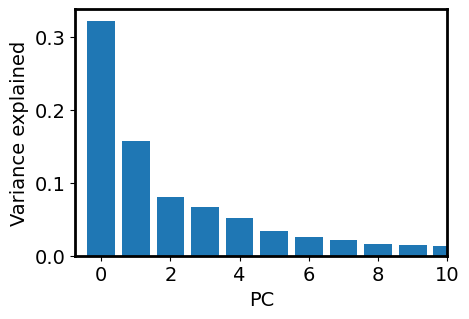

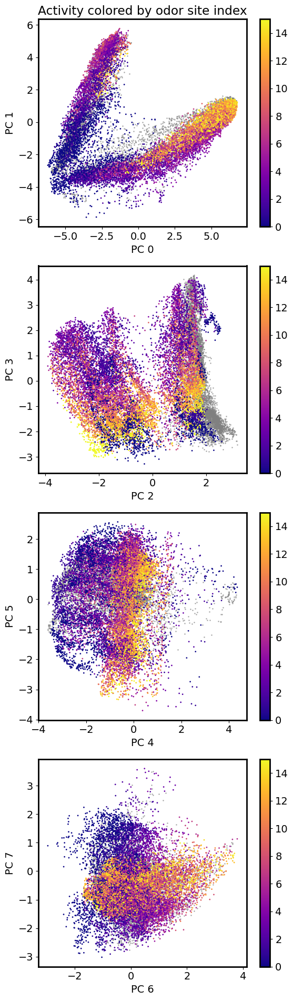

In [200]:
scale = 0.8
fig, axs = plt.subplots(1, 1, figsize=(6 * scale, 4 * scale))

axs.bar(np.arange(explained_variance_ratios.shape[0]), explained_variance_ratios)
axs.set_xlim(-0.75, 10)
axs.set_ylabel('Variance explained')
axs.set_xlabel('PC')

scale = 1.2
fig, axs = plt.subplots(4, 1, figsize=(5 * scale, 16 * scale))


for k in np.arange(0, 8, 2):
    cbar = axs[int(k/2)].scatter(
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k][session_data['reward_site_idx'] < 0],
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k+1][session_data['reward_site_idx'] < 0],
        s=1,
        c='grey',
        alpha=0.5,
        # vmax=2,
    )
    cbar = axs[int(k/2)].scatter(
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k][session_data['reward_site_idx'] >= 0],
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k+1][session_data['reward_site_idx'] >= 0],
        s=1,
        c=session_data['reward_site_idx'][session_data['reward_site_idx'] >= 0],
        cmap='plasma',
        # vmax=2,
    )
    axs[int(k/2)].set_xlabel(f'PC {k}')
    axs[int(k/2)].set_ylabel(f'PC {k+1}')
    fig.colorbar(cbar)

axs[0].set_title('Activity colored by odor site index')
fig.tight_layout()

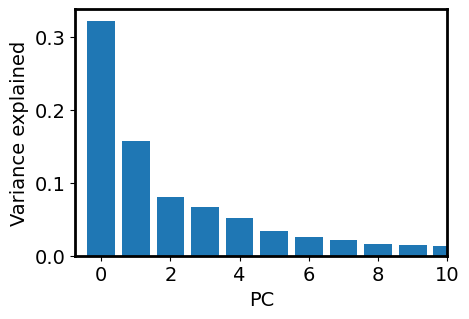

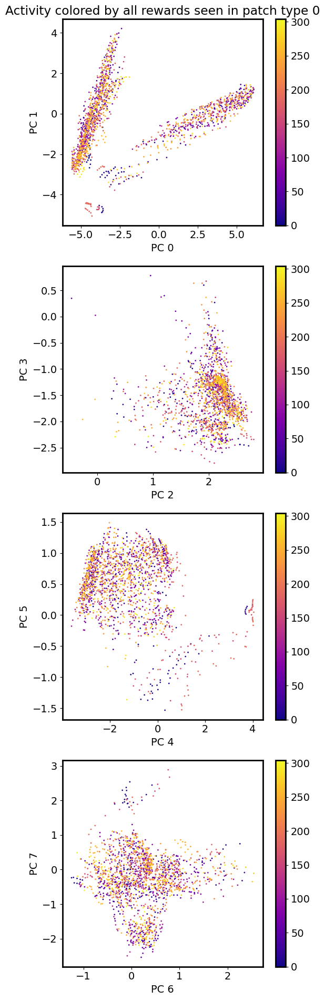

In [189]:
scale = 0.8
fig, axs = plt.subplots(1, 1, figsize=(6 * scale, 4 * scale))

axs.bar(np.arange(explained_variance_ratios.shape[0]), explained_variance_ratios)
axs.set_xlim(-0.75, 10)
axs.set_ylabel('Variance explained')
axs.set_xlabel('PC')

scale = 1.2
fig, axs = plt.subplots(4, 1, figsize=(5 * scale, 16 * scale))


for k in np.arange(0, 8, 2):
        # patch_nums = session_data['current_patch_num'].astype(int)
        # mask_on = np.logical_and(session_data['agent_in_patch'] > 0, patch_nums == i)
        # mask_off = np.logical_and(session_data['agent_in_patch'] <= 0, patch_nums == i)
    cbar = axs[int(k/2)].scatter(
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k][session_data['agent_in_patch'] <= 0],
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k+1][session_data['agent_in_patch'] <= 0],
        s=1,
        c=(session_data['rewards_seen_in_patch_type'][:, 0])[session_data['agent_in_patch'] <= 0],
        alpha=1,
        cmap='plasma',
        vmin=0,
    )
    axs[int(k/2)].set_xlabel(f'PC {k}')
    axs[int(k/2)].set_ylabel(f'PC {k+1}')
    fig.colorbar(cbar)
axs[0].set_title('Activity colored by all rewards seen in patch type 0')
fig.tight_layout()

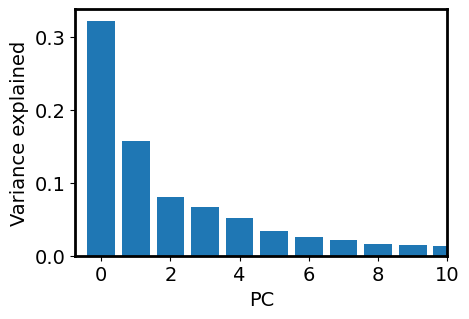

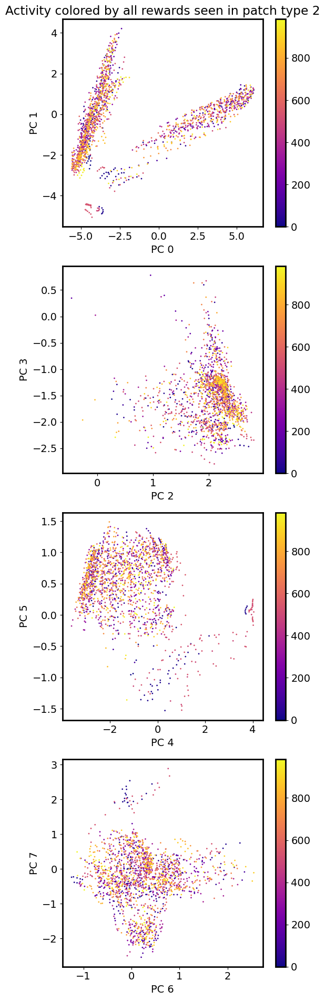

In [198]:
scale = 0.8
fig, axs = plt.subplots(1, 1, figsize=(6 * scale, 4 * scale))

axs.bar(np.arange(explained_variance_ratios.shape[0]), explained_variance_ratios)
axs.set_xlim(-0.75, 10)
axs.set_ylabel('Variance explained')
axs.set_xlabel('PC')

scale = 1.2
fig, axs = plt.subplots(4, 1, figsize=(5 * scale, 16 * scale))


for k in np.arange(0, 8, 2):
        # patch_nums = session_data['current_patch_num'].astype(int)
        # mask_on = np.logical_and(session_data['agent_in_patch'] > 0, patch_nums == i)
        # mask_off = np.logical_and(session_data['agent_in_patch'] <= 0, patch_nums == i)
    cbar = axs[int(k/2)].scatter(
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k][session_data['agent_in_patch'] <= 0],
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k+1][session_data['agent_in_patch'] <= 0],
        s=1,
        c=(session_data['rewards_seen_in_patch_type'][:, 2])[session_data['agent_in_patch'] <= 0],
        alpha=1,
        cmap='plasma',
        vmin=0,
    )
    axs[int(k/2)].set_xlabel(f'PC {k}')
    axs[int(k/2)].set_ylabel(f'PC {k+1}')
    fig.colorbar(cbar)
axs[0].set_title('Activity colored by all rewards seen in patch type 2')
fig.tight_layout()

In [190]:
env_idx = 2

data = load_hidden_activity('../data/rl_agent_outputs/long_sesh_slow_learn_test_2024-11-14_13_52_24_131302_var_noise_0_activity_weight_0/hidden_state/*.npy')
data = np.transpose(data, [2, 1, 0])
flattened_data = data.reshape(data.shape[0], data.shape[1] * data.shape[2])
print(data.shape)
print(flattened_data.shape)

session_data = parse_session('../data/rl_agent_outputs/long_sesh_slow_learn_test_2024-11-14_13_52_24_131302_var_noise_0_activity_weight_0/state', env_idx)

pca = PCA()
pc_activities = pca.fit_transform(flattened_data.T)

(128, 210, 20000)
(128, 4200000)
['00001.pkl', '00002.pkl', '00003.pkl', '00004.pkl', '00005.pkl', '00006.pkl', '00007.pkl']


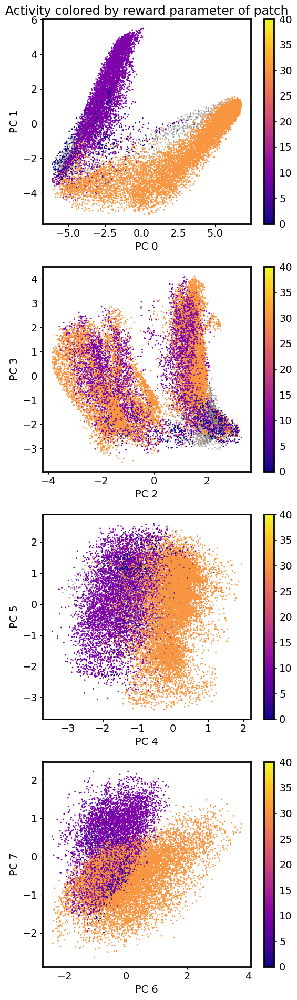

In [191]:
scale = 1.2
fig, axs = plt.subplots(4, 1, figsize=(5 * scale, 16 * scale))


for k in np.arange(0, 8, 2):
    cbar = axs[int(k/2)].scatter(
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k][session_data['agent_in_patch'] <= 0],
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k+1][session_data['agent_in_patch'] <= 0],
        s=1,
        c='grey',
        alpha=0.5,
        # vmax=2,
    )
    cbar = axs[int(k/2)].scatter(
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k][session_data['agent_in_patch'] > 0],
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k+1][session_data['agent_in_patch'] > 0],
        s=1,
        c=session_data['patch_reward_param'][session_data['agent_in_patch'] > 0],
        cmap='plasma',
        vmin=0,
        vmax=40,
    )
    axs[int(k/2)].set_xlabel(f'PC {k}')
    axs[int(k/2)].set_ylabel(f'PC {k+1}')
    fig.colorbar(cbar)
axs[0].set_title('Activity colored by reward parameter of patch')
fig.tight_layout()

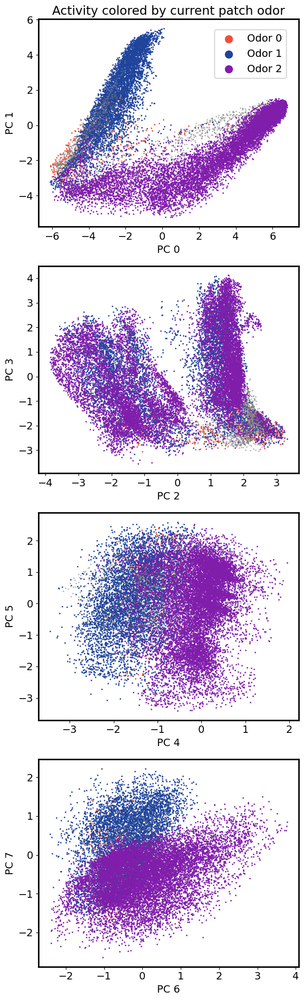

In [192]:
scale = 1.2
fig, axs = plt.subplots(4, 1, figsize=(5 * scale, 16 * scale))
colors = ['#F05039', '#1F449C', '#801dab']

for k in np.arange(0, 8, 2):
    for i in range(3):
        patch_nums = session_data['current_patch_num'].astype(int)
        mask_on = np.logical_and(session_data['agent_in_patch'] > 0, patch_nums == i)
        mask_off = np.logical_and(session_data['agent_in_patch'] <= 0, patch_nums == i)
        
        axs[int(k/2)].scatter(
            pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k][mask_off],
            pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k+1][mask_off],
            s=1,
            c='grey',
            alpha=0.5,
        )
        if k == 0:
            axs[int(k/2)].scatter(
                pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k][mask_on],
                pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k+1][mask_on],
                s=1,
                color=colors[i],
                label=f'Odor {i}'
            )
        else:
            axs[int(k/2)].scatter(
                pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k][mask_on],
                pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k+1][mask_on],
                s=1,
                color=colors[i],
            )
    axs[int(k/2)].set_xlabel(f'PC {k}')
    axs[int(k/2)].set_ylabel(f'PC {k+1}')
    axs[0].set_title('Activity colored by current patch odor')
    fig.legend(markerscale=10, bbox_to_anchor=(0.94, 0.97))
fig.tight_layout()

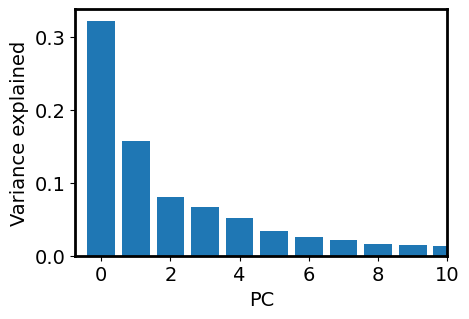

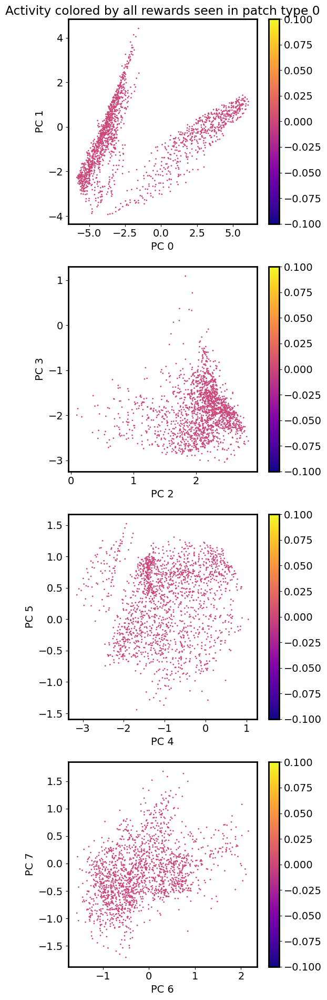

In [193]:
scale = 0.8
fig, axs = plt.subplots(1, 1, figsize=(6 * scale, 4 * scale))

axs.bar(np.arange(explained_variance_ratios.shape[0]), explained_variance_ratios)
axs.set_xlim(-0.75, 10)
axs.set_ylabel('Variance explained')
axs.set_xlabel('PC')

scale = 1.2
fig, axs = plt.subplots(4, 1, figsize=(5 * scale, 16 * scale))


for k in np.arange(0, 8, 2):
        # patch_nums = session_data['current_patch_num'].astype(int)
        # mask_on = np.logical_and(session_data['agent_in_patch'] > 0, patch_nums == i)
        # mask_off = np.logical_and(session_data['agent_in_patch'] <= 0, patch_nums == i)
    cbar = axs[int(k/2)].scatter(
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k][session_data['agent_in_patch'] <= 0],
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k+1][session_data['agent_in_patch'] <= 0],
        s=1,
        c=(session_data['rewards_seen_in_patch_type'][:, 0])[session_data['agent_in_patch'] <= 0],
        alpha=1,
        cmap='plasma',
        vmin=0,
    )
    axs[int(k/2)].set_xlabel(f'PC {k}')
    axs[int(k/2)].set_ylabel(f'PC {k+1}')
    fig.colorbar(cbar)
axs[0].set_title('Activity colored by all rewards seen in patch type 0')
fig.tight_layout()

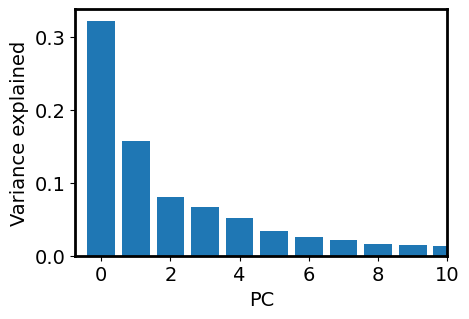

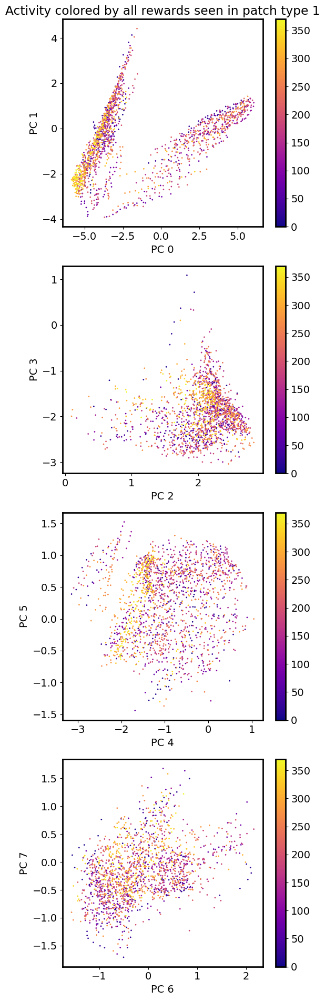

In [194]:
scale = 0.8
fig, axs = plt.subplots(1, 1, figsize=(6 * scale, 4 * scale))

axs.bar(np.arange(explained_variance_ratios.shape[0]), explained_variance_ratios)
axs.set_xlim(-0.75, 10)
axs.set_ylabel('Variance explained')
axs.set_xlabel('PC')

scale = 1.2
fig, axs = plt.subplots(4, 1, figsize=(5 * scale, 16 * scale))


for k in np.arange(0, 8, 2):
        # patch_nums = session_data['current_patch_num'].astype(int)
        # mask_on = np.logical_and(session_data['agent_in_patch'] > 0, patch_nums == i)
        # mask_off = np.logical_and(session_data['agent_in_patch'] <= 0, patch_nums == i)
    cbar = axs[int(k/2)].scatter(
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k][session_data['agent_in_patch'] <= 0],
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k+1][session_data['agent_in_patch'] <= 0],
        s=1,
        c=(session_data['rewards_seen_in_patch_type'][:, 1])[session_data['agent_in_patch'] <= 0],
        alpha=1,
        cmap='plasma',
        vmin=0,
    )
    axs[int(k/2)].set_xlabel(f'PC {k}')
    axs[int(k/2)].set_ylabel(f'PC {k+1}')
    fig.colorbar(cbar)
axs[0].set_title('Activity colored by all rewards seen in patch type 1')
fig.tight_layout()

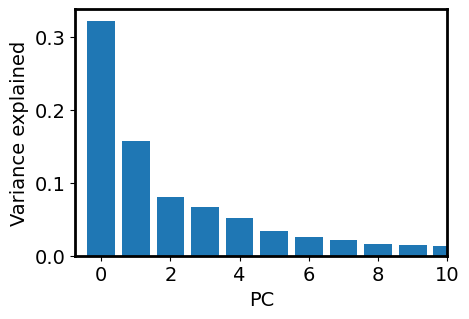

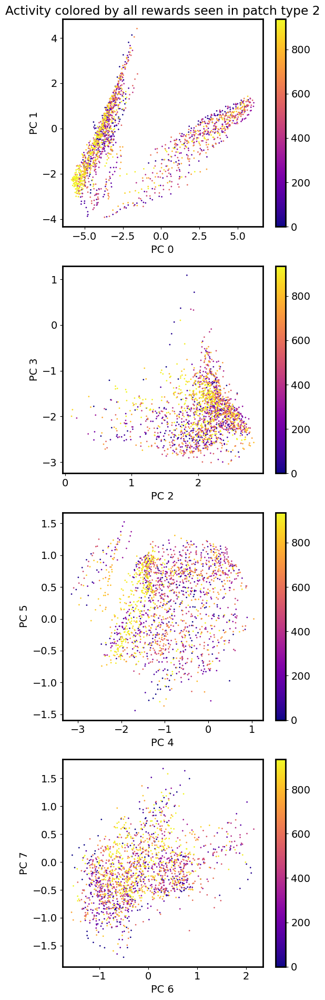

In [195]:
scale = 0.8
fig, axs = plt.subplots(1, 1, figsize=(6 * scale, 4 * scale))

axs.bar(np.arange(explained_variance_ratios.shape[0]), explained_variance_ratios)
axs.set_xlim(-0.75, 10)
axs.set_ylabel('Variance explained')
axs.set_xlabel('PC')

scale = 1.2
fig, axs = plt.subplots(4, 1, figsize=(5 * scale, 16 * scale))


for k in np.arange(0, 8, 2):
        # patch_nums = session_data['current_patch_num'].astype(int)
        # mask_on = np.logical_and(session_data['agent_in_patch'] > 0, patch_nums == i)
        # mask_off = np.logical_and(session_data['agent_in_patch'] <= 0, patch_nums == i)
    cbar = axs[int(k/2)].scatter(
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k][session_data['agent_in_patch'] <= 0],
        pc_activities[data.shape[2] * env_idx:data.shape[2] * (env_idx + 1), k+1][session_data['agent_in_patch'] <= 0],
        s=1,
        c=(session_data['rewards_seen_in_patch_type'][:, 2])[session_data['agent_in_patch'] <= 0],
        alpha=1,
        cmap='plasma',
        vmin=0,
    )
    axs[int(k/2)].set_xlabel(f'PC {k}')
    axs[int(k/2)].set_ylabel(f'PC {k+1}')
    fig.colorbar(cbar)
axs[0].set_title('Activity colored by all rewards seen in patch type 2')
fig.tight_layout()